# LMECA2300: Advanced Numerical Methods
## Assignment 6

**Students:**
- Student 1: Victor Lepère (61502000)
- Student 2: Max Opdecam(77062000)

### Radiated pressure fields through multipole decomposition

We begin by including the required packages and defining some physical constants describing the acoustic wave we want to simulate.

In [124]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('svg')  # Set SVG format for inline plots
import matplotlib.animation
from scipy.special import hankel2

### Physical constants
rho0 = 1.2 # air, 20°C, 1 atm
f = 1000 # [hz]
w = 2*np.pi*f # air -> 343 = w/k
k = w/343
lambda_ = (2*np.pi)/k

We implement a class Segment that features the radiation integration by decomposing into planar waves as described during the last course. This is implemented in the method `radiation_field`. We strictly followed the mathematical derivation from the last course hence we will not recall the formula's here. Note that we integrated the $\beta$-integral numerically based on composite Trapezium rule.
For comparison purposes, the method `naive_radiation_field` implements the slower but equivalent integration developped in the second assignment.
Our implementation is highly vectorized to benefit from fast performance. We also assumed in the implementation that the center of the source domain is the origin.

In [103]:
class Segment:

    def __init__(self, r1, r2):
        self.r1 = np.asarray(r1)
        self.r2 = np.asarray(r2)

    def __length(self):
        return np.linalg.norm(self.r2 - self.r1)

    def __translation_func(self, beta):
        R0 = np.linalg.norm(self.obs)
        phi0 = np.arctan2(self.obs[1], self.obs[0]) % (2 * np.pi) # the angles ranges from 0 to 2pi, as for beta rather than -pi, pi 

        l_values = np.arange(self.L + 1)
        c_values = np.where(l_values > 0, 2 * (-1j) ** l_values, 1)
        H2_values = hankel2(l_values, k*R0)

        result = c_values * np.cos(l_values[np.newaxis, :] * (beta[:, np.newaxis] - phi0)) * H2_values
        
        assert result.shape == (len(beta), self.L+1)

        return np.sum(result, axis=1)

    def __F(self, u_beta):
        p_half = k*(u_beta@(self.r2 - self.r1))/2
        return np.exp(1j*k*u_beta@self.r1) * self.__length() * np.exp(1j*p_half) * np.sinc(p_half / np.pi)
    
    def naive_radiated_field(self, grid_domain, Vn=1, m=2000):
        """
        Radiation integral computation from HW2
        """
        grid_domain = np.atleast_2d(grid_domain) # (N,2)

        s = np.linspace(0, 1, m) # (m,)
        diff = grid_domain[:, np.newaxis, :] - (self.r1 + s[:, np.newaxis] * (self.r2-self.r1)) # (N,m,2)
        rho = np.linalg.norm(diff, axis=-1) # (N,m)

        H = hankel2(0, k * rho) # (N,m)
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        
        H[:, 0] *= 1/2
        H[:, -1] *= 1/2

        integral = w * rho0 * Vn * self.__length() * np.sum(H, axis=1) / (4*m) # (N,)
        return integral


    def radiated_field(self, obs, grid_domain, Vn=1, m=50, L=35):
        """
        Integrates radiation integral for grid_domain with center obs

        @param obs: coord of center of observation domain
        @param grid_domain: coords of grid nodes where to compute pressure around the center
        @param Vn: normal velocity
        @param m: number of integration nodes used for beta discretization
        @param L + 1: number of terms of truncated Fourier series of Hankel function
        """
        self.obs = np.asarray(obs)
        grid_domain = np.asarray(grid_domain)
        self.L = L

        betas = (2*np.pi/m) * np.arange(m + 1)
        u_betas = np.hstack([np.cos(betas)[:, np.newaxis], np.sin(betas)[:, np.newaxis]])
        
        assert u_betas.shape == (m+1,2)

        radiation_patterns = self.__F(u_betas)
        planar_waves = np.exp(-1j * k * u_betas @ (grid_domain - self.obs[np.newaxis, :]).T)
        trans_funcs = self.__translation_func(betas)

        assert radiation_patterns.shape == (m+1,), radiation_patterns.shape
        assert planar_waves.shape == (m+1, len(grid_domain)), planar_waves.shape
        assert trans_funcs.shape == (m+1,), trans_funcs.shape

        integral = radiation_patterns[:, np.newaxis] * planar_waves * trans_funcs[:, np.newaxis]
        integral[0, :] *= 0.5
        integral[m, :] *= 0.5

        return w * rho0 * Vn * np.sum(integral, axis=0) / (4*m)

As a case study, we consider a vertical segment centered a the origin of length $\frac{\lambda}{10}$. The square observation domain is $10 \lambda$ east of the segment and centered around $(10 \lambda, 0)$. The domain has length $\lambda$. 

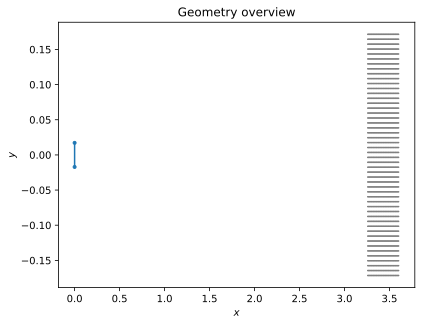

In [123]:
### Geometry
theSegment = Segment([0, -lambda_/20], [0, +lambda_/20])
theObserver = [10 * lambda_, 0]

x = np.linspace(-.5*lambda_, .5*lambda_, 50)
X, Y = np.meshgrid(x + theObserver[0], x + theObserver[1])
theDomain = np.column_stack((X.ravel(), Y.ravel()))

pressures = theSegment.radiated_field(theObserver, theDomain)

### Plot
plt.figure(dpi=150)
plt.plot([theSegment.r1[0], theSegment.r2[0]], [theSegment.r1[1], theSegment.r2[1]], ".-")
plt.scatter(theDomain[:, 0], theDomain[:, 1], c='gray', marker='+', s=.75)
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.title("Geometry overview")
plt.show()

We can visualize the resulting wave in the following 3D visualization.

In [105]:
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

dt = 1/(10*f)
def animate(t):
    plt.cla()
    p = np.real(pressures * np.exp(1j* w * t * dt))
    ax.plot_surface(X, Y, p.reshape(X.shape), alpha=.8)

    #ax.view_init(elev=60, azim=20)

    # plt.xlim(-.6* lambda_ + theObserver[0], .6* lambda_ + theObserver[0])
    # plt.xlim(-.6* lambda_ + theObserver[1], .6* lambda_ + theObserver[1])
    ax.set_zlim(-8, 8)
    ax.set_title("Pressure field")
    fig.tight_layout()
    

matplotlib.animation.FuncAnimation(fig, animate, frames=50, interval=100)

### Error analysis

We will now compare the two solutions and assess the accuracy. Our error metric is defined as:
$$
\text{error} = \frac{|P - P^*|}{|P^*|}
$$
Our reference solution $P^*$ consists of the integration of HW2 with many integration points.

In [110]:
naive_pressures = theSegment.naive_radiated_field(theDomain, m=10000) # reference solution

Ms = np.arange(10, 200, 10)
errors = np.zeros_like(Ms, dtype=float)
for i in range(len(Ms)):
    pressures = theSegment.radiated_field(theObserver, theDomain, m=Ms[i], L=50)

    errors[i] = np.mean(np.abs(pressures - naive_pressures) / np.abs(pressures))

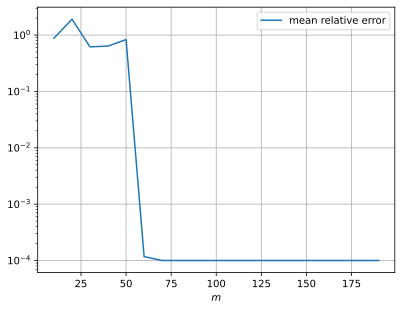

In [111]:
plt.plot(Ms, errors, label="mean relative error")
plt.legend()
plt.grid()
plt.xlabel("$m$")
plt.yscale("log")
plt.show()

In [121]:
Ls = np.arange(2, 80, 1)
errors_l = np.zeros_like(Ls, dtype=float)
for i in range(len(Ls)):
    pressures = theSegment.radiated_field(theObserver, theDomain, m=100, L=Ls[i])

    errors_l[i] = np.mean(np.abs(pressures - naive_pressures) / np.abs(pressures))

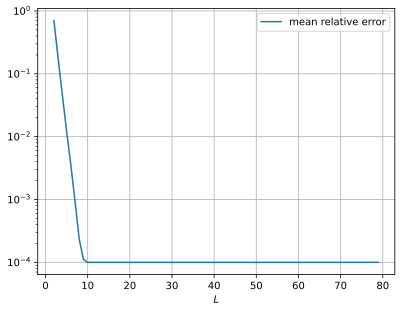

In [122]:
plt.plot(Ls, errors_l, label="mean relative error")
plt.legend()
plt.grid()
plt.xlabel("$L$")
plt.yscale("log")
plt.show()